In [1]:
#importação de bibliotecas utilizadas
import numpy as np 
import pandas as pd 
import json
import os
import csv
import igraph as ig

In [2]:
df = pd.read_csv("..\Jupyter Notebook\COVID19Dataset\metadata.csv", low_memory=False)

In [3]:
#Criação de uma variável auxiliar que pega o dado que interessa do csv importado e não pega os valores nulos desse campo
df_notna_aux1 = df[df['abstract'].notna()]

#Da váriavel auxiliar anterior pega os autores
df_notna_aux2 = df_notna_aux1[df_notna_aux1['authors'].notna()]

#Da anterior pega a data de publicação
df_notna_aux3 = df_notna_aux2[df_notna_aux2['publish_time'].notna()]

#Da anterior pega o arquivo json 
#df_notna = df_notna_aux3[df_notna_aux2['pdf_json_files'].notna()]
df_notna = df_notna_aux3.loc[df_notna_aux2['pdf_json_files'].notna()]

In [4]:
#Converte o formato de plublish_time 
#df_notna['publish_time'] = pd.to_datetime(df_notna['publish_time'])
df_notna.loc[:, 'publish_time'] = pd.to_datetime(df_notna['publish_time'])

C:\Users\sarah\AppData\Local\Temp\ipykernel_15144\1759508008.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_notna.loc[:, 'publish_time'] = pd.to_datetime(df_notna['publish_time'])
C:\Users\sarah\AppData\Local\Temp\ipykernel_15144\1759508008.py:3: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  df_notna.loc[:, 'publish_time'] = pd.to_datetime(df_notna['publish_time'])


In [5]:
#filtra o ano de 2020 somente
df_ano = df_notna[(df_notna['publish_time'] >= '2020-01-01 00:00:00')]
df_ano = df_notna[(df_notna['publish_time'] <= '2021-01-01 00:00:00')]

In [6]:
#filtro com os nomes de pelo menos uma das vacinas
df_finalizado = df_ano.loc[df_notna['abstract'].str.contains("Coronavac|Astrazeneca|Moderna|Janssen|Pfizer", case=False)]

In [7]:
print("Número de artigos DFFinalizado: ",len(df_finalizado))
print("Número de artigos DFNotNA: ",len(df_notna))

Número de artigos DFFinalizado:  82
Número de artigos DFNotNA:  325855


In [8]:
pd.set_option('display.max_rows', None)
df_finalizado.head()

,cord_uid,sha,source_x,title,doi,pmcid,pubmed_id,license,abstract,publish_time,authors,journal,mag_id,who_covidence_id,arxiv_id,pdf_json_files,pmc_json_files,url,s2_id
2764,1vimqhdp,b30770ae30b35cdfaf0a173863e74e93edbb0329,PMC,36th International Symposium on Intensive Care...,10.1186/s13054-016-1208-6,PMC5493079,27885969,cc-by,P001 - Sepsis impairs the capillary response w...,2016-04-20,"Bateman, R. M.; Sharpe, M. D.; Jagger, J. E.; ...",Crit Care,NaN,NaN,NaN,document_parses/pdf_json/b30770ae30b35cdfaf0a1...,NaN,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5...,NaN
3127,gw2cow0d,27fb200a637c8fff339f06399be1d563e365a7a9,PMC,DIVA metabolomics: Differentiating vaccination...,10.1371/journal.pone.0194488,PMC5886402,29621258,cc-by,Bovine Respiratory Disease (BRD) is a major so...,2018-04-05,"Gray, Darren W.; Welsh, Michael D.; Mansoor, F...",PLoS One,NaN,NaN,NaN,document_parses/pdf_json/27fb200a637c8fff339f0...,document_parses/pmc_json/PMC5886402.xml.json,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5...,NaN
4268,glufb745,19072f6c5d5ce2f05bf0dc205d889b6ead14bd9d,PMC,Global mapping of randomised trials related ar...,10.1186/s13063-019-3944-9,PMC6947860,31910857,cc-by,BACKGROUND: Randomised controlled trials (RCTs...,2020-01-07,"Catalá-López, Ferrán; Aleixandre-Benavent, Raf...",Trials,NaN,NaN,NaN,document_parses/pdf_json/19072f6c5d5ce2f05bf0d...,document_parses/pmc_json/PMC6947860.xml.json,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6...,NaN
8257,i3bbo0qg,6c0e812085b545051383ce67d04d55f54ff012d2,PMC,RNA pseudoknots downstream of the frameshift s...,10.1016/1050-3862(91)90013-h,PMC7128882,1663382,no-cc,RNA pseudoknot structural motifs could have im...,2002-11-25,"Shu-Yun Le; Shapiro, Bruce A.; Chen, Jih-H.; N...",Genet Anal Tech Appl,NaN,NaN,NaN,document_parses/pdf_json/6c0e812085b545051383c...,NaN,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7...,NaN
33323,uc46rzw4,7c0a84e461b53a1db6645bc4577a3e0b54783abb,PMC,"Week 48 Results of EMERALD: A Phase 3, Randomi...",10.1093/ofid/ofx180.009,PMC5631339,NaN,cc-by-nc-nd,BACKGROUND: EMERALD is evaluating the efficacy...,2017-10-04,"Orkin, Chloe; Molina, Jean-Michel; Gallant, Jo...",Open Forum Infect Dis,NaN,NaN,NaN,document_parses/pdf_json/7c0a84e461b53a1db6645...,NaN,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5...,NaN


In [9]:
df_notna.head()

,cord_uid,sha,source_x,title,doi,pmcid,pubmed_id,license,abstract,publish_time,authors,journal,mag_id,who_covidence_id,arxiv_id,pdf_json_files,pmc_json_files,url,s2_id
0,ug7v899j,d1aafb70c066a2068b02786f8929fd9c900897fb,PMC,Clinical features of culture-proven Mycoplasma...,10.1186/1471-2334-1-6,PMC35282,11472636,no-cc,OBJECTIVE: This retrospective chart review des...,2001-07-04,"Madani, Tariq A; Al-Ghamdi, Aisha A",BMC Infect Dis,NaN,NaN,NaN,document_parses/pdf_json/d1aafb70c066a2068b027...,document_parses/pmc_json/PMC35282.xml.json,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3...,NaN
1,02tnwd4m,6b0567729c2143a66d737eb0a2f63f2dce2e5a7d,PMC,Nitric oxide: a pro-inflammatory mediator in l...,10.1186/rr14,PMC59543,11667967,no-cc,Inflammatory diseases of the respiratory tract...,2000-08-15,"Vliet, Albert van der; Eiserich, Jason P; Cros...",Respir Res,NaN,NaN,NaN,document_parses/pdf_json/6b0567729c2143a66d737...,document_parses/pmc_json/PMC59543.xml.json,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5...,NaN
2,ejv2xln0,06ced00a5fc04215949aa72528f2eeaae1d58927,PMC,Surfactant protein-D and pulmonary host defense,10.1186/rr19,PMC59549,11667972,no-cc,Surfactant protein-D (SP-D) participates in th...,2000-08-25,"Crouch, Erika C",Respir Res,NaN,NaN,NaN,document_parses/pdf_json/06ced00a5fc04215949aa...,document_parses/pmc_json/PMC59549.xml.json,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5...,NaN
3,2b73a28n,348055649b6b8cf2b9a376498df9bf41f7123605,PMC,Role of endothelin-1 in lung disease,10.1186/rr44,PMC59574,11686871,no-cc,Endothelin-1 (ET-1) is a 21 amino acid peptide...,2001-02-22,"Fagan, Karen A; McMurtry, Ivan F; Rodman, David M",Respir Res,NaN,NaN,NaN,document_parses/pdf_json/348055649b6b8cf2b9a37...,document_parses/pmc_json/PMC59574.xml.json,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5...,NaN
4,9785vg6d,5f48792a5fa08bed9f56016f4981ae2ca6031b32,PMC,Gene expression in epithelial cells in respons...,10.1186/rr61,PMC59580,11686888,no-cc,Respiratory syncytial virus (RSV) and pneumoni...,2001-05-11,"Domachowske, Joseph B; Bonville, Cynthia A; Ro...",Respir Res,NaN,NaN,NaN,document_parses/pdf_json/5f48792a5fa08bed9f560...,document_parses/pmc_json/PMC59580.xml.json,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5...,NaN


In [8]:
#Aqui é feita a união de caminho de diretório de forma portável, 
#armazenando os caminhos completos em uma lista
datafiles = []
for filename in df_finalizado['pdf_json_files']:
    ifile = os.path.join('..\Jupyter Notebook\COVID19Dataset', filename)
    datafiles.append(ifile)
    
with open(datafiles[0],'r')as f:
    doc = json.load(f)

In [48]:
#Autores, instituições, pais, região, cidade, titulo, abstract, data
#referencias e mais de um autor separado por ";"
id2bib = []
for file in datafiles:
    try:
        with open(file,'r')as f:
            doc = json.load(f)
        id = doc['paper_id']
        title = doc['metadata']['title']
        abstract = doc['abstract']
        authors_doc = doc['metadata']['authors']
        bibEntries = []
        for key,value in doc['bib_entries'].items():
            refid = key
            title = value['title']
            authors_bib = value['authors']
            year = value['year']
            venue = value['venue']
            try:
                DOI = value['other_ids']['DOI'][0]
            except:
                DOI = np.nan

            bibEntries.append({"refid_bib": refid,\
                          "title":title,\
                          "authors_bib": authors_bib,\
                          "year": year,\
                          "DOI": DOI})
        id2bib.append({"id": id, "abstract": abstract,"title": title, "authors_doc": authors_doc, "bib": bibEntries})
    except:
        pass

Estrutura id2bib: \
id, abstract, title, authors_doc, bib\
dentro de authors_doc:\
first, middle, last, suffix, affiliation, email\
dentro de affiliation:\
laboratory, institution, location\
dentro de location:\
settlement, region, country\
\
dentro de bib: \
refid_bib, title, authors_bib, year, DOI\
dentro de authors_bib:\
first, middle, last, suffix
 
Anotações:
* filtrar os autores e dar ID (id, autor nome e não pode repetir)
* fazer um arquivo com as conexões(id, id, peso) 
* Montar com o sigma

In [10]:
#salvando em um csv
# transformar id2bib em DataFrame
df = pd.DataFrame(id2bib)

# salvar em um arquivo CSV
df.to_csv('id2bib.csv', index=False)

In [50]:
#cria um dicionário com o nome do autor e o ID sem repetições
authors_set = set()
authors_dict = {}
author_names_dict = {}
article_dict = {}
contID = 0

for item in id2bib:
    article_authors = []
    for autores in item['authors_doc']:
        first = autores['first'].strip().replace(" ", "_")
        middle = '_'.join(autores['middle']).strip().replace(" ", "_")
        last = autores['last'].strip().replace(" ", "_")
        suffix = autores['suffix'].strip().replace(" ", "_")
        
        names = [first, middle, last, suffix]
        full_name = '_'.join([name for name in names if name])
        
        if full_name not in authors_set:
            authors_set.add(full_name)
            author_id = contID
            authors_dict[author_id] = full_name
            author_names_dict[full_name] = author_id
            contID += 1
        else:
            author_id = author_names_dict[full_name]
        
        article_authors.append({'author_id': author_id, 'full_name': full_name})
    article_dict[item['id']] = article_authors


In [51]:
counter = 0
for k, v in article_dict.items():
    if counter == 2:
        break
    print(f"{k}: {v}")
    counter += 1

b30770ae30b35cdfaf0a173863e74e93edbb0329: [{'author_id': 0, 'full_name': 'Reference_M_Bateman'}, {'author_id': 1, 'full_name': 'R_M_Sharpe'}, {'author_id': 2, 'full_name': 'M_D_Jagger'}, {'author_id': 3, 'full_name': 'J_E_Ellis'}, {'author_id': 4, 'full_name': 'C_G'}]
27fb200a637c8fff339f06399be1d563e365a7a9: [{'author_id': 5, 'full_name': 'Darren_W_Gray'}, {'author_id': 6, 'full_name': 'Michael_D_Welsh'}, {'author_id': 7, 'full_name': 'Fawad_Mansoor'}, {'author_id': 8, 'full_name': 'Simon_Doherty'}, {'author_id': 9, 'full_name': 'Olivier_P_Chevallier'}, {'author_id': 10, 'full_name': 'Christopher_T_Elliott'}, {'author_id': 11, 'full_name': 'Mark_H_Mooney'}]


In [52]:
#teste para selecionar só cada autor e seu id
all_authors = []
for article in article_dict.values():
    all_authors += article

In [53]:
#salvando artigos com id e autor em csv article_dict
with open('article_dict.csv', 'w', encoding='utf-8') as f:
    writer = csv.writer(f)
    writer.writerow(['article_id', 'author_id', 'full_name'])
    for article_id, authors in article_dict.items():
        for author in authors:
            writer.writerow([article_id, author['author_id'], author['full_name']])

In [54]:
#cria um dicionário de coautoria com o ID do autor 1, ID do autor 2 e a qtde de vezes que fizeram artigo juntos(ID,ID,Peso)
co_author_dict = {}
for article_id, article_authors in article_dict.items():
    for i in range(len(article_authors)):
        for j in range(i + 1, len(article_authors)):
            author1 = article_authors[i]['author_id']
            author2 = article_authors[j]['author_id']
            if (author1, author2) in co_author_dict:
                co_author_dict[(author1, author2)] += 1
            elif (author2, author1) in co_author_dict:
                co_author_dict[(author2, author1)] += 1
            else:
                co_author_dict[(author1, author2)] = 1

#salva em um csv
with open('co_author_dict.csv', 'w', encoding='utf-8', newline='') as f:
    writer = csv.writer(f)
    writer.writerow(['author1', 'author2', 'num_articles'])
    for (author1, author2), num_articles in co_author_dict.items():
        writer.writerow([author1, author2, num_articles])

In [55]:
!pip install pycairo

In [56]:
# carregar o dicionário de coautoria do CSV para um dataframe
df = pd.read_csv("co_author_dict.csv")

# extrair as colunas author1, author2 e num_articles do dataframe
data = df[['author1', 'author2', 'num_articles']].values.tolist()

# criar um grafo vazio
g = ig.Graph()

# adicionar os vértices
vertices = set()
for i in data:
    vertices.update(i[:2])
vertices = list(vertices)
g.add_vertices(len(vertices))

# criar a tabela de correspondência de nome de vértice para índice
vertex_dict = {v: i for i, v in enumerate(vertices)}

# adicionar as arestas
g.add_edges([(vertex_dict[v[0]], vertex_dict[v[1]]) for v in data])

# atribuir pesos às arestas
g.es['weight'] = [t[2] for t in data]

# visualizar o grafo
ig.plot(g, vertex_size=2, edge_width=[e["weight"]*1 for e in g.es], edge_curved=False)

In [57]:
# definir o layout do grafo
layout = g.layout_kamada_kawai()

# definir o tamanho e a cor dos vértices
vertex_size = 5
vertex_color = 'darkblue'

# definir a espessura e a cor das arestas
edge_width = [e["weight"]*0.05 for e in g.es]
edge_color = 'black'

# visualizar o grafo
ig.plot(g, layout=layout, vertex_size=vertex_size, vertex_color=vertex_color,
        edge_width=edge_width, edge_color=edge_color)

In [19]:
print(len(vertex_dict))

943


###Rede de citações
Cada nó representa um artigo e as arestas representam as citações feitas por um artigo em outro artigo.\\

In [58]:
# Cria um grafo vazio
G = ig.Graph(directed=True)

# Adiciona os vértices dos documentos
for item in id2bib:
    G.add_vertex(name=item['id'], title=item['title'], abstract=item['abstract'])

# Cria um dicionário que mapeia refid_bib para id
refid2id = {}
for entry in id2bib:
    refid2id.update({bibEntry['refid_bib']: entry['id'] for bibEntry in entry['bib']})

# Adiciona os vértices dos artigos citados e as arestas de citação
for entry in id2bib:
    for bibEntry in entry['bib']:
        # Verifica se o refid_bib existe no dicionário e adiciona a aresta de citação
        if bibEntry['refid_bib'] in refid2id:
            G.add_vertex(name=bibEntry['refid_bib'], title=bibEntry['title'], year=bibEntry['year'])
            G.add_edge(entry['id'], refid2id[bibEntry['refid_bib']], value=bibEntry['refid_bib'])

# Cria um grafo para os documentos que citam artigos
Gs = ig.Graph(directed=True)
for entry in id2bib:
    for bibEntry in entry['bib']:
        Gs.add_vertex(name=entry['id'], title=entry['title'], abstract=entry['abstract'])
        if bibEntry['refid_bib'] in refid2id:
            Gs.add_vertex(name=bibEntry['refid_bib'], title=bibEntry['title'], year=bibEntry['year'])
            Gs.add_edge(entry['id'], bibEntry['refid_bib'], value=bibEntry['refid_bib'])

            
layout = Gs.layout_fruchterman_reingold()

# Plota o grafo com escala logarítmica
ig.plot(Gs, layout=layout, vertex_size=3, edge_width=0.2, edge_arrow_size=0.5, vertex_label=None, bbox=(0, 0, 800, 800))
#O print desse fica muito pesado

In [16]:
print("Número de vértices em Gs:", Gs.vcount())
print("Número de arestas em Gs:", Gs.ecount())

Número de vértices em Gs: 6524
Número de arestas em Gs: 3262


In [25]:
# Obtém o caminho absoluto do diretório atual
current_dir = os.getcwd()

# Constrói o caminho completo para o arquivo JSON
json_path = os.path.join(current_dir, 'TesteCitacoes.json')

# Chama a função ig_to_json passando o caminho completo
ig_to_json(Gs, json_path)

UnicodeEncodeError: 'charmap' codec can't encode character '\u03b1' in position 1621: character maps to <undefined>

In [23]:
# Define as propriedades visuais do grafo
visual_style = {
    "vertex_size": 5,
    "vertex_label_size": 8,
    "edge_width": 0.1,
    "layout": Gs.layout_fruchterman_reingold(),
}

# Plota o grafo
ig.plot(Gs, **visual_style)


###Rede de filiação\
Cada nó representa entidades, universidades e centros de pesquisa e as arestas quando os autores participaram de um mesmo artigo. 

In [30]:
# dicionário com o nome da instituição como chave e um número exclusivo como valor
instituicoes = {}
num = 0

for artigo in id2bib:
    autores = artigo['authors_doc']
    for autor in autores:
        afiliacao = autor.get('affiliation')
        if afiliacao:
            instituicao = afiliacao.get('institution')
            if instituicao:
                if instituicao not in instituicoes:
                    num += 1
                    instituicoes[instituicao] = num

In [31]:
# dicionário com o número exclusivo como chave e o nome da instituição como valor
instituicoes = {}
num = 0

for artigo in id2bib:
    autores = artigo['authors_doc']
    for autor in autores:
        afiliacao = autor.get('affiliation')
        if afiliacao:
            instituicao = afiliacao.get('institution')
            if instituicao:
                if instituicao not in instituicoes.values():
                    num += 1
                    instituicoes[num] = instituicao


In [32]:
print(instituicoes[77])

University of Toronto


In [33]:
#mapeia os autores às suas respectivas instituições
instituicoes_autores = {}

for artigo in id2bib:
    autores = artigo['authors_doc']
    for autor in autores:
        afiliacao = autor.get('affiliation')
        if afiliacao:
            instituicao = afiliacao.get('institution')
            if instituicao:
                if instituicao not in instituicoes_autores:
                    instituicoes_autores[instituicao] = []
                first = autor['first'].strip().replace(" ", "_")
                middle = '_'.join(autor['middle']).strip().replace(" ", "_")
                last = autor['last'].strip().replace(" ", "_")
                suffix = autor['suffix'].strip().replace(" ", "_")
                names = [first, middle, last, suffix]
                full_name = '_'.join([name for name in names if name])
                instituicoes_autores[instituicao].append(full_name)


In [34]:
print(list(instituicoes_autores.items())[:2])

[("Queen's University Belfast (QUB)", ['Darren_W_Gray', 'Olivier_P_Chevallier', 'Christopher_T_Elliott', 'Mark_H_Mooney']), ('Agri-Food and Biosciences Institute (AFBI)', ['Michael_D_Welsh', 'Fawad_Mansoor', 'Simon_Doherty'])]


In [35]:
import itertools

# mapeia os autores às suas respectivas instituições
instituicoes_autores = {}

for artigo in id2bib:
    autores = artigo['authors_doc']
    for autor in autores:
        afiliacao = autor.get('affiliation')
        if afiliacao:
            instituicao = afiliacao.get('institution')
            if instituicao:
                if instituicao not in instituicoes_autores:
                    instituicoes_autores[instituicao] = []
                first = autor['first'].strip().replace(" ", "_")
                middle = '_'.join(autor['middle']).strip().replace(" ", "_")
                last = autor['last'].strip().replace(" ", "_")
                suffix = autor['suffix'].strip().replace(" ", "_")
                names = [first, middle, last, suffix]
                full_name = '_'.join([name for name in names if name])
                instituicoes_autores[instituicao].append(full_name)

# cria a lista de combinações de instituições que colaboraram em cada artigo
combinacoes = []
for artigo in id2bib:
    autores = artigo['authors_doc']
    instituicoes = []
    for autor in autores:
        afiliacao = autor.get('affiliation')
        if afiliacao:
            instituicao = afiliacao.get('institution')
            if instituicao:
                instituicoes.append(instituicao)
    if len(instituicoes) > 1:
        for comb in itertools.combinations(set(instituicoes), 2):
            found = False
            for c in combinacoes:
                if set(comb) == set(c[:2]):
                    c[2] += 1
                    found = True
                    break
            if not found:
                combinacoes.append([comb[0], comb[1], 1])
                
# exibe a lista de combinações de instituições que colaboraram em mais de um artigo
for comb in combinacoes:
    if comb[2] > 1:
        print(f"{comb[0]} - {comb[1]} ({comb[2]})")


Centro de Hematología y Medicina Interna - Universidad Autonoma de Nuevo Leon, Hospital Universitario "Dr. José Eleuterio Gonzalez" (2)
Hospital Universitario de Salamanca - Hospital General Universitario de Alicante (2)
Hospital Universitario de Salamanca - Hospital Universitario Ramón y Cajal (2)
Hospital General Universitario de Alicante - Hospital Universitario Ramón y Cajal (2)


In [46]:
# cria o dicionário de combinações de instituições para artigos
instituicoes_artigos = {}
for comb in combinacoes:
    instituicao1 = comb[0]
    instituicao2 = comb[1]
    for artigo in id2bib:
        autores = artigo['authors_doc']
        instituicoes = []
        for autor in autores:
            afiliacao = autor.get('affiliation')
            if afiliacao:
                instituicao = afiliacao.get('institution')
                if instituicao:
                    instituicoes.append(instituicao)
        if instituicao1 in instituicoes and instituicao2 in instituicoes:
            if (instituicao1, instituicao2) not in instituicoes_artigos:
                instituicoes_artigos[(instituicao1, instituicao2)] = [artigo]
            else:
                instituicoes_artigos[(instituicao1, instituicao2)].append(artigo)

In [37]:
print(combinacoes[7])

['University of North Carolina at Chapel Hill', 'Rocky Mountain Laboratories', 1]


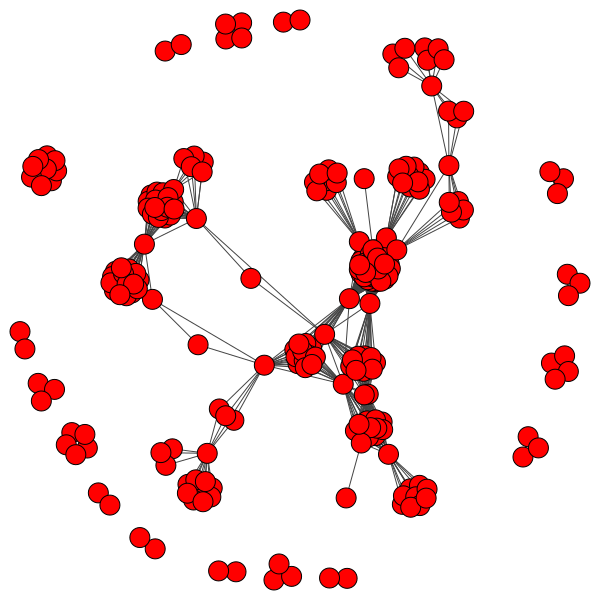

In [44]:
# Cria lista de nós (instituições)
nodes = list(set([i for sublist in combinacoes for i in sublist[:2]]))

# Cria lista de arestas
edges = [(comb[0], comb[1]) for comb in combinacoes]

# Cria o grafo
g = ig.Graph()

# Adiciona os nós ao grafo
g.add_vertices(nodes)

# Adiciona as arestas ao grafo
g.add_edges(edges)

# Atribui a label com o nome do nó
g["label"] = nodes

# Define o layout e plota o grafo com escala logarítmica
layout = g.layout("fruchterman_reingold", dim=2, weights=None)
ig.plot(g, layout=layout)


In [40]:
print("Número de vértices em g:", g.vcount())
print("Número de arestas em g:", g.ecount())

Número de vértices em g: 253
Número de arestas em g: 2304


In [ ]:
# Obtém o caminho absoluto do diretório atual
current_dir = os.getcwd()

# Constrói o caminho completo para o arquivo JSON
json_path = os.path.join(current_dir, 'TesteFiliacao.json')

# Chama a função ig_to_json passando o caminho completo
ig_to_json(g, json_path)